#1.1 dataset visualisation


All codes made with help of LLM services (Chat Gpt and Claude 3.7) by feeding the question subpart as the prompt

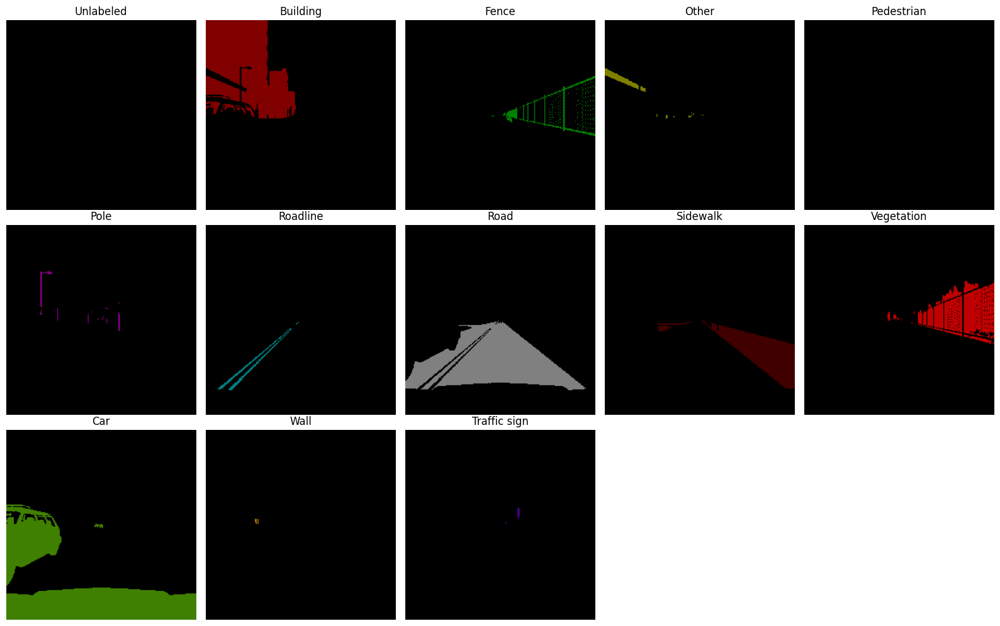

In [4]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Class names
CLASS_NAMES = [
    "Unlabeled", "Building", "Fence", "Other", "Pedestrian",
    "Pole", "Roadline", "Road", "Sidewalk", "Vegetation",
    "Car", "Wall", "Traffic sign"
]

# RGB to class index mapping (used for mask conversion)
RGB_TO_CLASS = {
    (0, 0, 0): 0,      # Unlabeled
    (1, 0, 0): 1,
    (2, 0, 0): 2,
    (3, 0, 0): 3,
    (4, 0, 0): 4,
    (5, 0, 0): 5,
    (6, 0, 0): 6,
    (7, 0, 0): 7,
    (8, 0, 0): 8,
    (9, 0, 0): 9,
    (10, 0, 0): 10,
    (11, 0, 0): 11,
    (12, 0, 0): 12,
}

# Color palette for visualization (distinct RGB tuples)
CLASS_COLORS = [
    (0, 0, 0),          # Unlabeled
    (128, 0, 0),        # Building
    (0, 128, 0),        # Fence
    (128, 128, 0),      # Other
    (0, 0, 128),        # Pedestrian
    (128, 0, 128),      # Pole
    (0, 128, 128),      # Roadline
    (128, 128, 128),    # Road
    (64, 0, 0),         # Sidewalk
    (192, 0, 0),        # Vegetation
    (64, 128, 0),       # Car
    (192, 128, 0),      # Wall
    (64, 0, 128)        # Traffic sign
]

def visualize_class_masks_colorcoded(mask_path):
    """
    Visualizes individual class masks with color coding.
    """
    mask = Image.open(mask_path).convert("RGB")
    mask_np = np.array(mask)
    h, w, _ = mask_np.shape

    # Convert RGB mask to class index mask
    class_mask = np.zeros((h, w), dtype=np.uint8)
    for rgb, class_idx in RGB_TO_CLASS.items():
        match = np.all(mask_np == rgb, axis=-1)
        class_mask[match] = class_idx

    # Plot color-coded masks
    plt.figure(figsize=(16, 10))
    for class_idx in range(len(CLASS_NAMES)):
        binary_mask = (class_mask == class_idx).astype(np.uint8)
        color_mask = np.zeros((h, w, 3), dtype=np.uint8)
        color_mask[binary_mask == 1] = CLASS_COLORS[class_idx]

        plt.subplot(3, 5, class_idx + 1)
        plt.imshow(color_mask)
        plt.title(CLASS_NAMES[class_idx])
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# Example usage
mask_path = "dataset_224/train/labels/02_00_000.png"  # change to a real file path
visualize_class_masks_colorcoded(mask_path)

This was Class-vise visualisation 

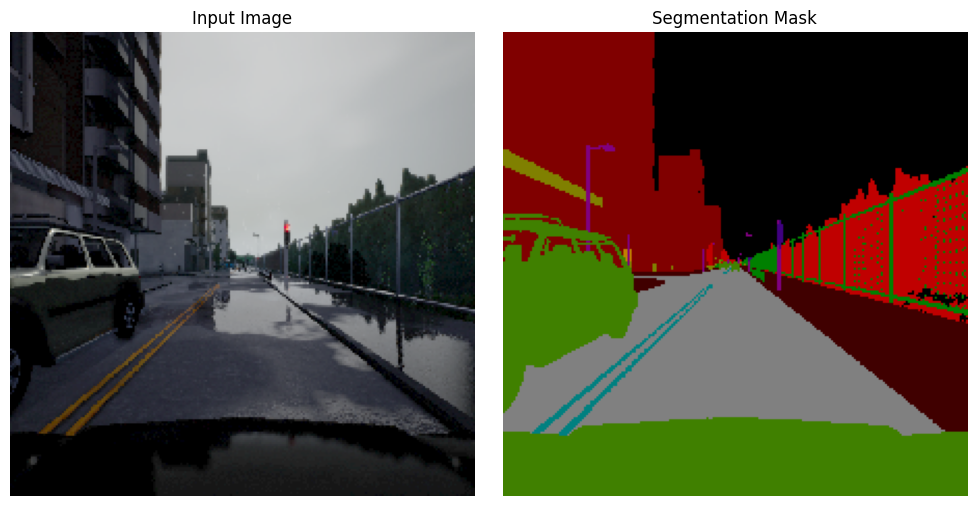

In [6]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Define class-color mapping for visualization
CLASS_COLORS = [
    (0, 0, 0),          # Unlabeled
    (128, 0, 0),        # Building
    (0, 128, 0),        # Fence
    (128, 128, 0),      # Other
    (0, 0, 128),        # Pedestrian
    (128, 0, 128),      # Pole
    (0, 128, 128),      # Roadline
    (128, 128, 128),    # Road
    (64, 0, 0),         # Sidewalk
    (192, 0, 0),        # Vegetation
    (64, 128, 0),       # Car
    (192, 128, 0),      # Wall
    (64, 0, 128)        # Traffic sign
]

RGB_TO_CLASS = {
    (0, 0, 0): 0, (1, 0, 0): 1, (2, 0, 0): 2, (3, 0, 0): 3,
    (4, 0, 0): 4, (5, 0, 0): 5, (6, 0, 0): 6, (7, 0, 0): 7,
    (8, 0, 0): 8, (9, 0, 0): 9, (10, 0, 0): 10, (11, 0, 0): 11,
    (12, 0, 0): 12
}

def mask_to_color(mask_class_np):
    """
    Convert class index mask to RGB mask using CLASS_COLORS
    """
    color_mask = np.zeros((mask_class_np.shape[0], mask_class_np.shape[1], 3), dtype=np.uint8)
    for cls_idx, color in enumerate(CLASS_COLORS):
        color_mask[mask_class_np == cls_idx] = color
    return color_mask

def visualize_image_and_mask(image_path, mask_path):
    """
    Visualizes original image and its corresponding color-coded mask side by side
    """
    image = Image.open(image_path).convert("RGB")
    mask = Image.open(mask_path).convert("RGB")

    mask_np = np.array(mask)
    mask_class = np.zeros((mask_np.shape[0], mask_np.shape[1]), dtype=np.int64)

    for rgb, cls in RGB_TO_CLASS.items():
        matches = np.all(mask_np == rgb, axis=-1)
        mask_class[matches] = cls

    color_mask = mask_to_color(mask_class)

    # Plot image and mask side by side
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(color_mask)
    plt.title("Segmentation Mask")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

# Example usage
img_path = "dataset_224/train/images/02_00_000.png"
mask_path = "dataset_224/train/labels/02_00_000.png"
visualize_image_and_mask(img_path, mask_path)

This is visualisation of the full mask

In [19]:
from tqdm import tqdm

Creating Dataset class

In [13]:
import os
import torch
import numpy as np
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

RGB_TO_CLASS = {
    (0, 0, 0): 0, (1, 0, 0): 1, (2, 0, 0): 2, (3, 0, 0): 3,
    (4, 0, 0): 4, (5, 0, 0): 5, (6, 0, 0): 6, (7, 0, 0): 7,
    (8, 0, 0): 8, (9, 0, 0): 9, (10, 0, 0): 10, (11, 0, 0): 11,
    (12, 0, 0): 12,
}

class SegmentationDataset(Dataset):
    def __init__(self, images_dir, masks_dir, transform=None):
        self.images_dir = images_dir
        self.masks_dir = masks_dir
        self.transform = transform
        self.images = [f for f in os.listdir(images_dir)
                       if os.path.isfile(os.path.join(images_dir, f))]

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = os.path.join(self.images_dir, self.images[idx])
        mask_path = os.path.join(self.masks_dir, self.images[idx])

        image = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        mask_np = np.array(mask)
        mask_class = np.zeros((mask_np.shape[0], mask_np.shape[1]), dtype=np.int64)
        for rgb, cls in RGB_TO_CLASS.items():
            mask_class[np.all(mask_np == rgb, axis=-1)] = cls

        return image, torch.from_numpy(mask_class).long()

FCN 32s

In [7]:
import torch
import torch.nn as nn
from torchvision import models
from torchvision.models import VGG16_Weights

class FCN32s(nn.Module):
    def __init__(self, num_classes=13, freeze_backbone=True):
        super(FCN32s, self).__init__()

        # Load pre-trained VGG16
        vgg = models.vgg16(weights=VGG16_Weights.DEFAULT)

        # Feature extractor (up to pool5)
        self.features = vgg.features  # Output: [B, 512, 7, 7]

        # Freeze backbone if specified
        if freeze_backbone:
            for param in self.features.parameters():
                param.requires_grad = False

        # Fully convolutional layers (converted FC6 and FC7)
        self.classifier = nn.Sequential(
            nn.Conv2d(512, 4096, kernel_size=7, padding=3),  # FC6
            nn.ReLU(inplace=True),
            nn.Dropout(),

            nn.Conv2d(4096, 4096, kernel_size=1),            # FC7
            nn.ReLU(inplace=True),
            nn.Dropout(),

            nn.Conv2d(4096, num_classes, kernel_size=1)      # Final classifier
        )

        # Upsampling: from 7x7 → 224x224 (stride=32)
        self.upsample = nn.ConvTranspose2d(
            num_classes, num_classes, kernel_size=64, stride=32, padding=16, bias=False
        )

        self._init_weights()

    def forward(self, x):
        input_size = x.shape[2:]  # Store (H, W)

        x = self.features(x)      # [B, 512, 7, 7]
        x = self.classifier(x)    # [B, num_classes, 7, 7]
        x = self.upsample(x)      # [B, num_classes, 224, 224]

        # Just in case upsample overshoots, crop to input size
        x = x[:, :, :input_size[0], :input_size[1]]
        return x

    def _init_weights(self):
        # Initialize upsampling layer as bilinear (close approximation)
        for m in self.upsample.modules():
            if isinstance(m, nn.ConvTranspose2d):
                nn.init.xavier_normal_(m.weight)

In [8]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ---------------------- Metrics ----------------------
def mean_iou(pred, target, num_classes=13):
    ious = []
    pred = pred.argmax(dim=1).cpu().numpy()
    target = target.squeeze(1).cpu().numpy()

    for cls in range(num_classes):
        pred_inds = pred == cls
        target_inds = target == cls

        intersection = (pred_inds & target_inds).sum()
        union = (pred_inds | target_inds).sum()

        if union > 0:
            ious.append(float(intersection) / float(union))

    return np.mean(ious) if len(ious) > 0 else 0.0

Training Loop

In [ ]:
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=50):
    train_losses, train_ious = [], []
    val_losses, val_ious = [], []

    best_val_iou = 0.0

    for epoch in range(num_epochs):
        model.train()
        epoch_train_loss, epoch_train_iou = 0, 0
        train_batches = 0

        for images, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Training"):
            images, masks = images.to(device), masks.to(device)

            outputs = model(images)
            loss = criterion(outputs, masks)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            epoch_train_loss += loss.item()
            epoch_train_iou += mean_iou(outputs, masks)
            train_batches += 1

        model.eval()
        epoch_val_loss, epoch_val_iou = 0, 0
        val_batches = 0

        with torch.no_grad():
            for images, masks in tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Validation"):
                images, masks = images.to(device), masks.to(device)

                outputs = model(images)
                loss = criterion(outputs, masks)

                epoch_val_loss += loss.item()
                epoch_val_iou += mean_iou(outputs, masks)
                val_batches += 1

        # Averages
        epoch_train_loss /= train_batches
        epoch_train_iou /= train_batches
        epoch_val_loss /= val_batches
        epoch_val_iou /= val_batches

        train_losses.append(epoch_train_loss)
        train_ious.append(epoch_train_iou)
        val_losses.append(epoch_val_loss)
        val_ious.append(epoch_val_iou)

        print(f"\nEpoch {epoch+1}:")
        print(f"Train Loss: {epoch_train_loss:.4f}, mIoU: {epoch_train_iou:.4f}")
        print(f"Val   Loss: {epoch_val_loss:.4f}, mIoU: {epoch_val_iou:.4f}")

        if epoch_val_iou > best_val_iou:
            best_val_iou = epoch_val_iou
            torch.save(model.state_dict(), "best_fcn32s_model.pth")
            print("Saved new best model!")

    return train_losses, train_ious, val_losses, val_ious

Visualisation Loop

In [11]:
# ---------------------- Visualization ----------------------
def visualize_predictions(model, test_loader, num_samples=5):
    import matplotlib.pyplot as plt
    model.eval()
    fig, axs = plt.subplots(num_samples, 3, figsize=(15, 5*num_samples))

    if num_samples == 1:
        axs = [axs]

    with torch.no_grad():
        count = 0
        for images, masks in test_loader:
            if count >= num_samples:
                break

            images = images.to(device)
            outputs = model(images)
            preds = outputs.argmax(dim=1).cpu().numpy()
            image = images[0].cpu().permute(1, 2, 0).numpy()
            image = image * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
            image = np.clip(image, 0, 1)

            true_mask = masks[0].cpu().numpy()
            pred_mask = preds[0]

            cmap = plt.cm.get_cmap('tab20', 13)

            axs[count][0].imshow(image)
            axs[count][0].set_title("Image")
            axs[count][1].imshow(true_mask, cmap=cmap, vmin=0, vmax=12)
            axs[count][1].set_title("Ground Truth")
            axs[count][2].imshow(pred_mask, cmap=cmap, vmin=0, vmax=12)
            axs[count][2].set_title("Prediction")
            for ax in axs[count]: ax.axis("off")

            count += 1

    plt.tight_layout()
    plt.savefig("fcn32s_predictions.png")
    plt.show()

Plotting loop(for metrics)

In [12]:
# ---------------------- Plotting ----------------------
def plot_metrics(train_losses, train_ious, val_losses, val_ious):
    plt.figure(figsize=(15, 6))

    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label="Train Loss")
    plt.plot(val_losses, label="Val Loss")
    plt.title("Loss over Epochs")
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(train_ious, label="Train mIoU")
    plt.plot(val_ious, label="Val mIoU")
    plt.title("mIoU over Epochs")
    plt.legend()

    plt.tight_layout()
    plt.savefig("fcn32s_metrics.png")
    plt.show()

In [14]:
def get_train_transform():
    return transforms.Compose([
        transforms.Resize((224, 224)),
        #transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

def get_test_transform():
    return transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

In [15]:
import torch.optim as optim

Driver function for FCN-32s (Frozen params)

Training FCN-32s...


Epoch 1/10 - Validation: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]



Epoch 1:
Train Loss: 0.8080, mIoU: 0.2687
Val   Loss: 0.4571, mIoU: 0.3574
Saved new best model!


Epoch 2/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]



Epoch 2:
Train Loss: 0.4015, mIoU: 0.3814
Val   Loss: 0.3651, mIoU: 0.3978
Saved new best model!


Epoch 3/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.59it/s]



Epoch 3:
Train Loss: 0.3380, mIoU: 0.4155
Val   Loss: 0.3257, mIoU: 0.4253
Saved new best model!


Epoch 4/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.26it/s]



Epoch 4:
Train Loss: 0.3069, mIoU: 0.4398
Val   Loss: 0.3040, mIoU: 0.4454
Saved new best model!


Epoch 5/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.24it/s]



Epoch 5:
Train Loss: 0.2875, mIoU: 0.4592
Val   Loss: 0.2896, mIoU: 0.4554
Saved new best model!


Epoch 6/10 - Validation: 100%|██████████| 50/50 [00:07<00:00,  7.00it/s]



Epoch 6:
Train Loss: 0.2713, mIoU: 0.4762
Val   Loss: 0.2797, mIoU: 0.4675
Saved new best model!


Epoch 7/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.29it/s]



Epoch 7:
Train Loss: 0.2618, mIoU: 0.4888
Val   Loss: 0.2770, mIoU: 0.4884
Saved new best model!


Epoch 8/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.31it/s]



Epoch 8:
Train Loss: 0.2525, mIoU: 0.5015
Val   Loss: 0.2676, mIoU: 0.4800


Epoch 9/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.18it/s]



Epoch 9:
Train Loss: 0.2438, mIoU: 0.5106
Val   Loss: 0.2578, mIoU: 0.5075
Saved new best model!


Epoch 10/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.39it/s]



Epoch 10:
Train Loss: 0.2367, mIoU: 0.5182
Val   Loss: 0.2564, mIoU: 0.5111
Saved new best model!


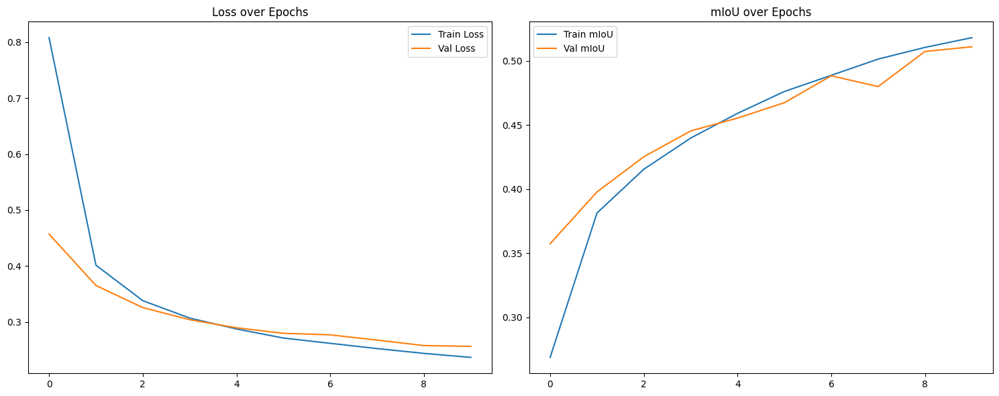

C:\Users\SHARS\AppData\Local\Temp\ipykernel_22116\2911838624.py:35: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("best_fcn32s_model.pth"))


Best model loaded.


Testing: 100%|██████████| 500/500 [00:10<00:00, 49.03it/s]
C:\Users\SHARS\AppData\Local\Temp\ipykernel_22116\2724766315.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab20', 13)


Test mIoU: 0.4933


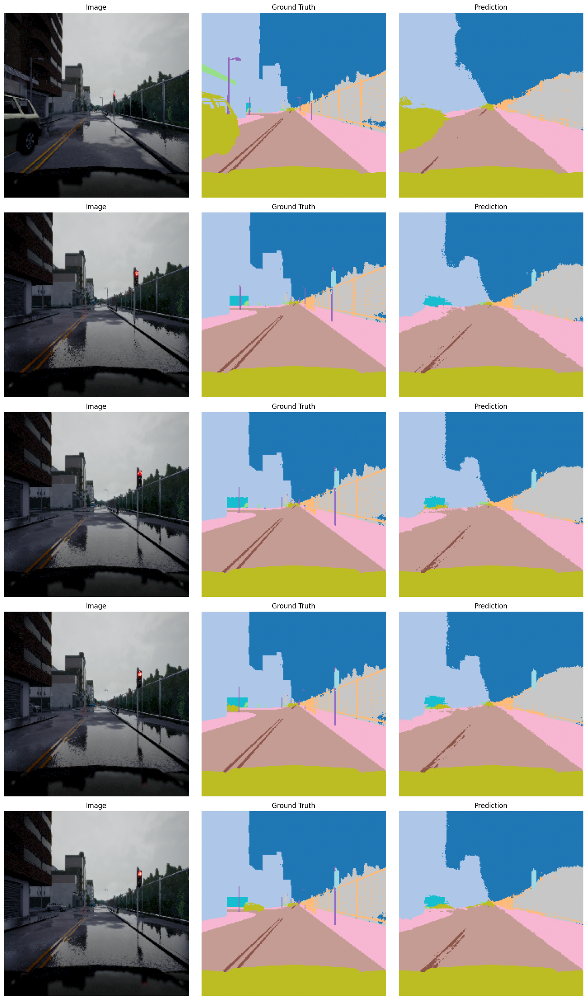

In [27]:
# ---------------------- Main ----------------------
def main():
    data_dir = "./dataset_224"
    train_img_dir = os.path.join(data_dir, "train/images")
    train_mask_dir = os.path.join(data_dir, "train/labels")
    test_img_dir = os.path.join(data_dir, "test/images")
    test_mask_dir = os.path.join(data_dir, "test/labels")

    # Dataset & transforms
    train_dataset = SegmentationDataset(train_img_dir, train_mask_dir, transform=get_train_transform())
    train_size = int(0.8 * len(train_dataset))
    val_size = len(train_dataset) - train_size
    train_subset, val_subset = torch.utils.data.random_split(train_dataset, [train_size, val_size])

    test_dataset = SegmentationDataset(test_img_dir, test_mask_dir, transform=get_test_transform())

    train_loader = DataLoader(train_subset, batch_size=8, shuffle=True)
    val_loader = DataLoader(val_subset, batch_size=8, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

    model = FCN32s(num_classes=13,freeze_backbone=True).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-4)

    # Train
    print("Training FCN-32s...")
    train_losses, train_ious, val_losses, val_ious = train_model(
        model, train_loader, val_loader, criterion, optimizer, num_epochs=10
    )

    # Plot metrics
    plot_metrics(train_losses, train_ious, val_losses, val_ious)

    # Load best model
    model.load_state_dict(torch.load("best_fcn32s_model.pth"))
    print("Best model loaded.")

    # Evaluate on test set
    model.eval()
    test_iou = 0
    with torch.no_grad():
        for images, masks in tqdm(test_loader, desc="Testing"):
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            test_iou += mean_iou(outputs, masks)

    test_iou /= len(test_loader)
    print(f"Test mIoU: {test_iou:.4f}")

    # Visualize
    visualize_predictions(model, test_loader, num_samples=5)

if __name__ == "__main__":
    main()

Stats->

Best model val mIoU->0.5111

Best model Test mIoU->0.4933

In [ ]:
# import torch
# import torch.nn as nn
# import torchvision.models as models
# import torch.nn.functional as F

# class FCN16s(nn.Module):
#     def __init__(self, num_classes=13):
#         super(FCN16s, self).__init__()
#         vgg = models.vgg16(pretrained=True)
#         features = list(vgg.features.children())
        
#         # Break VGG16 into 5 blocks
#         self.block1 = nn.Sequential(*features[0:5])    # conv1_1 to pool1
#         self.block2 = nn.Sequential(*features[5:10])   # conv2_1 to pool2
#         self.block3 = nn.Sequential(*features[10:17])  # conv3_1 to pool3
#         self.block4 = nn.Sequential(*features[17:24])  # conv4_1 to pool4
#         self.block5 = nn.Sequential(*features[24:31])  # conv5_1 to pool5

#         # FC layers as conv
#         self.fc6 = nn.Conv2d(512, 4096, kernel_size=7, padding=3)  # acts like FC6
#         self.relu6 = nn.ReLU(inplace=True)
#         self.drop6 = nn.Dropout2d()

#         self.fc7 = nn.Conv2d(4096, 4096, kernel_size=1)            # FC7
#         self.relu7 = nn.ReLU(inplace=True)
#         self.drop7 = nn.Dropout2d()

#         self.score_fr = nn.Conv2d(4096, num_classes, kernel_size=1)

#         # 1x1 conv on pool4 (for skip connection)
#         self.score_pool4 = nn.Conv2d(512, num_classes, kernel_size=1)

#         # Upsampling layers
#         self.upscore2 = nn.ConvTranspose2d(num_classes, num_classes, kernel_size=4, stride=2, padding=1, bias=False)
#         self.upscore16 = nn.ConvTranspose2d(num_classes, num_classes, kernel_size=32, stride=16, padding=8, bias=False)

#     def forward(self, x):
#         x = self.block1(x)
#         x = self.block2(x)
#         x = self.block3(x)
#         pool3 = x
#         x = self.block4(x)
#         pool4 = x
#         x = self.block5(x)

#         x = self.fc6(x)
#         x = self.relu6(x)
#         x = self.drop6(x)

#         x = self.fc7(x)
#         x = self.relu7(x)
#         x = self.drop7(x)

#         x = self.score_fr(x)         # (N, num_classes, 7, 7)

#         x = self.upscore2(x)         # → (N, num_classes, 14, 14)
#         score_pool4 = self.score_pool4(pool4)  # → (N, num_classes, 14, 14)

#         x = x + score_pool4          # fuse

#         x = self.upscore16(x)        # → (N, num_classes, 224, 224)

#         return x

FCN16s(frozen params)

In [28]:
import torch
import torch.nn as nn
from torchvision import models
from torchvision.models import VGG16_Weights

class FCN16s(nn.Module):
    def __init__(self, num_classes=13, freeze_backbone=True):
        super(FCN16s, self).__init__()

        vgg = models.vgg16(weights=VGG16_Weights.DEFAULT)

        # VGG blocks for modular access
        self.features1 = nn.Sequential(*vgg.features[:17])  # up to pool3
        self.features2 = nn.Sequential(*vgg.features[17:24])  # pool4
        self.features3 = nn.Sequential(*vgg.features[24:])  # pool5

        if freeze_backbone:
            for param in self.features1.parameters():
                param.requires_grad = False
            for param in self.features2.parameters():
                param.requires_grad = False
            for param in self.features3.parameters():
                param.requires_grad = False

        # FC layers as convs
        self.classifier = nn.Sequential(
            nn.Conv2d(512, 4096, kernel_size=7, padding=3),  # FC6
            nn.ReLU(inplace=True),
            nn.Dropout(),

            nn.Conv2d(4096, 4096, kernel_size=1),            # FC7
            nn.ReLU(inplace=True),
            nn.Dropout(),

            nn.Conv2d(4096, num_classes, kernel_size=1)      # Final classifier
        )

        # Score from pool4
        self.score_pool4 = nn.Conv2d(512, num_classes, kernel_size=1)

        # Upsample layers
        self.upsample2x = nn.ConvTranspose2d(
            num_classes, num_classes, kernel_size=4, stride=2, padding=1, bias=False
        )
        self.upsample16x = nn.ConvTranspose2d(
            num_classes, num_classes, kernel_size=32, stride=16, padding=8, bias=False
        )

        self._init_weights()

    def forward(self, x):
        input_size = x.shape[2:]

        x = self.features1(x)        # Output after pool3
        pool4 = self.features2(x)    # Output after pool4
        x = self.features3(pool4)    # Output after pool5

        x = self.classifier(x)       # [B, C, 7, 7]
        x = self.upsample2x(x)       # [B, C, 14, 14]

        pool4_scored = self.score_pool4(pool4)  # [B, C, 14, 14]
        x = x + pool4_scored           # Add skip connection

        x = self.upsample16x(x)       # [B, C, 224, 224]
        x = x[:, :, :input_size[0], :input_size[1]]  # Crop if needed

        return x

    def _init_weights(self):
        for m in [self.upsample2x, self.upsample16x]:
            if isinstance(m, nn.ConvTranspose2d):
                nn.init.xavier_normal_(m.weight)

Training loop for Frozen params FCN16s

In [29]:
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=50):
    train_losses, train_ious = [], []
    val_losses, val_ious = [], []

    best_val_iou = 0.0

    for epoch in range(num_epochs):
        model.train()
        epoch_train_loss, epoch_train_iou = 0, 0
        train_batches = 0

        for images, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Training"):
            images, masks = images.to(device), masks.to(device)

            outputs = model(images)
            loss = criterion(outputs, masks)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            epoch_train_loss += loss.item()
            epoch_train_iou += mean_iou(outputs, masks)
            train_batches += 1

        model.eval()
        epoch_val_loss, epoch_val_iou = 0, 0
        val_batches = 0

        with torch.no_grad():
            for images, masks in tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Validation"):
                images, masks = images.to(device), masks.to(device)

                outputs = model(images)
                loss = criterion(outputs, masks)

                epoch_val_loss += loss.item()
                epoch_val_iou += mean_iou(outputs, masks)
                val_batches += 1

        # Averages
        epoch_train_loss /= train_batches
        epoch_train_iou /= train_batches
        epoch_val_loss /= val_batches
        epoch_val_iou /= val_batches

        train_losses.append(epoch_train_loss)
        train_ious.append(epoch_train_iou)
        val_losses.append(epoch_val_loss)
        val_ious.append(epoch_val_iou)

        print(f"\nEpoch {epoch+1}:")
        print(f"Train Loss: {epoch_train_loss:.4f}, mIoU: {epoch_train_iou:.4f}")
        print(f"Val   Loss: {epoch_val_loss:.4f}, mIoU: {epoch_val_iou:.4f}")

        if epoch_val_iou > best_val_iou:
            best_val_iou = epoch_val_iou
            torch.save(model.state_dict(), "best_fcn16s_model.pth")
            print("Saved new best model!")

    return train_losses, train_ious, val_losses, val_ious

Driver for FCN16s Frozen params

Training FCN-16s...


Epoch 1/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.47it/s]



Epoch 1:
Train Loss: 0.9687, mIoU: 0.2384
Val   Loss: 0.4660, mIoU: 0.3499
Saved new best model!


Epoch 2/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.42it/s]



Epoch 2:
Train Loss: 0.3965, mIoU: 0.3740
Val   Loss: 0.3532, mIoU: 0.3932
Saved new best model!


Epoch 3/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.41it/s]



Epoch 3:
Train Loss: 0.3247, mIoU: 0.4152
Val   Loss: 0.3107, mIoU: 0.4276
Saved new best model!


Epoch 4/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.44it/s]



Epoch 4:
Train Loss: 0.2874, mIoU: 0.4468
Val   Loss: 0.2824, mIoU: 0.4500
Saved new best model!


Epoch 5/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.49it/s]



Epoch 5:
Train Loss: 0.2640, mIoU: 0.4694
Val   Loss: 0.2667, mIoU: 0.4709
Saved new best model!


Epoch 6/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.50it/s]



Epoch 6:
Train Loss: 0.2483, mIoU: 0.4891
Val   Loss: 0.2555, mIoU: 0.4830
Saved new best model!


Epoch 7/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.55it/s]



Epoch 7:
Train Loss: 0.2364, mIoU: 0.5019
Val   Loss: 0.2467, mIoU: 0.4868
Saved new best model!


Epoch 8/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.49it/s]



Epoch 8:
Train Loss: 0.2269, mIoU: 0.5140
Val   Loss: 0.2394, mIoU: 0.4970
Saved new best model!


Epoch 9/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.52it/s]



Epoch 9:
Train Loss: 0.2195, mIoU: 0.5244
Val   Loss: 0.2339, mIoU: 0.5012
Saved new best model!


Epoch 10/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.49it/s]



Epoch 10:
Train Loss: 0.2134, mIoU: 0.5324
Val   Loss: 0.2296, mIoU: 0.5155
Saved new best model!


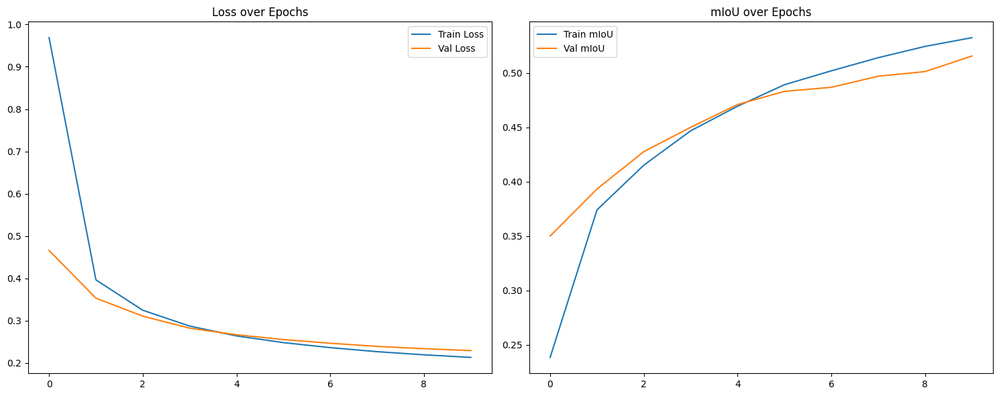

C:\Users\SHARS\AppData\Local\Temp\ipykernel_22116\1317234375.py:35: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("best_fcn16s_model.pth"))


Best model loaded.


Testing: 100%|██████████| 500/500 [00:10<00:00, 49.70it/s]
C:\Users\SHARS\AppData\Local\Temp\ipykernel_22116\2724766315.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab20', 13)


Test mIoU: 0.5000


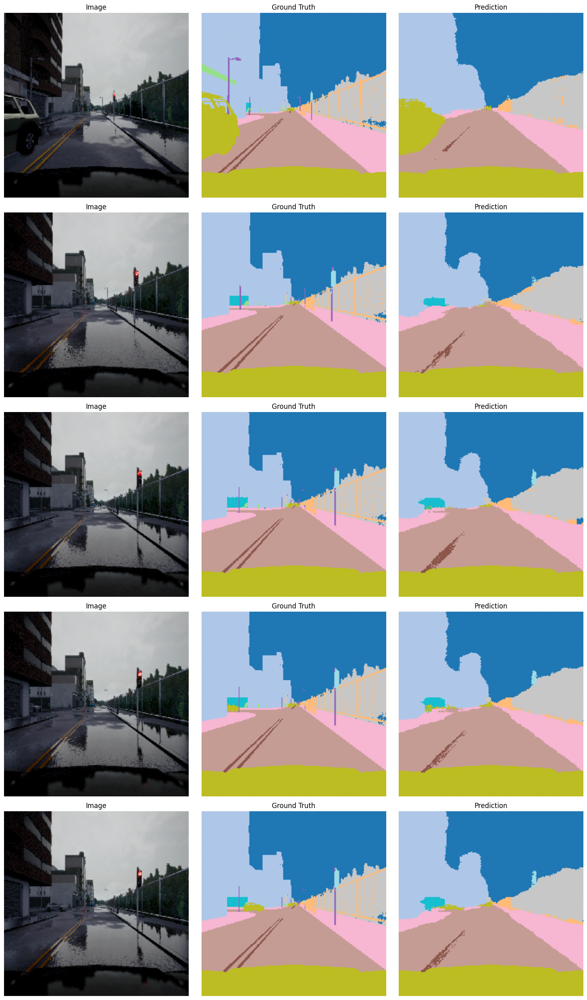

In [30]:
# ---------------------- Main ----------------------
def main():
    data_dir = "./dataset_224"
    train_img_dir = os.path.join(data_dir, "train/images")
    train_mask_dir = os.path.join(data_dir, "train/labels")
    test_img_dir = os.path.join(data_dir, "test/images")
    test_mask_dir = os.path.join(data_dir, "test/labels")

    # Dataset & transforms
    train_dataset = SegmentationDataset(train_img_dir, train_mask_dir, transform=get_train_transform())
    train_size = int(0.8 * len(train_dataset))
    val_size = len(train_dataset) - train_size
    train_subset, val_subset = torch.utils.data.random_split(train_dataset, [train_size, val_size])

    test_dataset = SegmentationDataset(test_img_dir, test_mask_dir, transform=get_test_transform())

    train_loader = DataLoader(train_subset, batch_size=8, shuffle=True)
    val_loader = DataLoader(val_subset, batch_size=8, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

    model = FCN16s(num_classes=13,freeze_backbone=True).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-4)

    # Train
    print("Training FCN-16s...")
    train_losses, train_ious, val_losses, val_ious = train_model(
        model, train_loader, val_loader, criterion, optimizer, num_epochs=10
    )

    # Plot metrics
    plot_metrics(train_losses, train_ious, val_losses, val_ious)

    # Load best model
    model.load_state_dict(torch.load("best_fcn16s_model.pth"))
    print("Best model loaded.")

    # Evaluate on test set
    model.eval()
    test_iou = 0
    with torch.no_grad():
        for images, masks in tqdm(test_loader, desc="Testing"):
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            test_iou += mean_iou(outputs, masks)

    test_iou /= len(test_loader)
    print(f"Test mIoU: {test_iou:.4f}")

    # Visualize
    visualize_predictions(model, test_loader, num_samples=5)

if __name__ == "__main__":
    main()

Stats->

Best model Val mIoU-> 0.5155

Best model Test mIoU-> 0.5000



FCN8s module

In [31]:
import torch
import torch.nn as nn
from torchvision import models
from torchvision.models import VGG16_Weights

class FCN8s(nn.Module):
    def __init__(self, num_classes=13, freeze_backbone=True):
        super(FCN8s, self).__init__()

        vgg = models.vgg16(weights=VGG16_Weights.DEFAULT)

        # VGG blocks
        self.features1 = nn.Sequential(*vgg.features[:17])   # up to pool3
        self.features2 = nn.Sequential(*vgg.features[17:24]) # pool4
        self.features3 = nn.Sequential(*vgg.features[24:])   # pool5

        if freeze_backbone:
            for layer in [self.features1, self.features2, self.features3]:
                for param in layer.parameters():
                    param.requires_grad = False

        # FC layers as convs
        self.classifier = nn.Sequential(
            nn.Conv2d(512, 4096, kernel_size=7, padding=3),  # FC6
            nn.ReLU(inplace=True),
            nn.Dropout(),

            nn.Conv2d(4096, 4096, kernel_size=1),            # FC7
            nn.ReLU(inplace=True),
            nn.Dropout(),

            nn.Conv2d(4096, num_classes, kernel_size=1)      # Final classifier
        )

        # Score layers from pool4 and pool3
        self.score_pool4 = nn.Conv2d(512, num_classes, kernel_size=1)
        self.score_pool3 = nn.Conv2d(256, num_classes, kernel_size=1)

        # Upsample layers
        self.upsample2x_1 = nn.ConvTranspose2d(
            num_classes, num_classes, kernel_size=4, stride=2, padding=1, bias=False
        )
        self.upsample2x_2 = nn.ConvTranspose2d(
            num_classes, num_classes, kernel_size=4, stride=2, padding=1, bias=False
        )
        self.upsample8x = nn.ConvTranspose2d(
            num_classes, num_classes, kernel_size=16, stride=8, padding=4, bias=False
        )

        self._init_weights()

    def forward(self, x):
        input_size = x.shape[2:]

        x = self.features1(x)         # → pool3
        pool3 = x

        x = self.features2(x)         # → pool4
        pool4 = x

        x = self.features3(x)         # → pool5
        x = self.classifier(x)        # classifier output

        x = self.upsample2x_1(x)      # upsample to pool4 size
        pool4_scored = self.score_pool4(pool4)  # score from pool4
        x = x + pool4_scored  # skip connection

        x = self.upsample2x_2(x)      # upsample to pool3 size
        pool3_scored = self.score_pool3(pool3) #score from pool 3
        x = x + pool3_scored    # skip connection

        x = self.upsample8x(x)        # final upsampling to input size
        x = x[:, :, :input_size[0], :input_size[1]]  # crop if needed

        return x

    def _init_weights(self):
        for m in [self.upsample2x_1, self.upsample2x_2, self.upsample8x]:
            if isinstance(m, nn.ConvTranspose2d):
                nn.init.xavier_normal_(m.weight)

In [32]:
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=50):
    train_losses, train_ious = [], []
    val_losses, val_ious = [], []

    best_val_iou = 0.0

    for epoch in range(num_epochs):
        model.train()
        epoch_train_loss, epoch_train_iou = 0, 0
        train_batches = 0

        for images, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Training"):
            images, masks = images.to(device), masks.to(device)

            outputs = model(images)
            loss = criterion(outputs, masks)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            epoch_train_loss += loss.item()
            epoch_train_iou += mean_iou(outputs, masks)
            train_batches += 1

        model.eval()
        epoch_val_loss, epoch_val_iou = 0, 0
        val_batches = 0

        with torch.no_grad():
            for images, masks in tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Validation"):
                images, masks = images.to(device), masks.to(device)

                outputs = model(images)
                loss = criterion(outputs, masks)

                epoch_val_loss += loss.item()
                epoch_val_iou += mean_iou(outputs, masks)
                val_batches += 1

        # Averages
        epoch_train_loss /= train_batches
        epoch_train_iou /= train_batches
        epoch_val_loss /= val_batches
        epoch_val_iou /= val_batches

        train_losses.append(epoch_train_loss)
        train_ious.append(epoch_train_iou)
        val_losses.append(epoch_val_loss)
        val_ious.append(epoch_val_iou)

        print(f"\nEpoch {epoch+1}:")
        print(f"Train Loss: {epoch_train_loss:.4f}, mIoU: {epoch_train_iou:.4f}")
        print(f"Val   Loss: {epoch_val_loss:.4f}, mIoU: {epoch_val_iou:.4f}")

        if epoch_val_iou > best_val_iou:
            best_val_iou = epoch_val_iou
            torch.save(model.state_dict(), "best_fcn8s_model.pth")
            print("Saved new best model!")

    return train_losses, train_ious, val_losses, val_ious

Driver for FCN8s module (frozen params)

Training FCN-16s...


Epoch 1/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.56it/s]



Epoch 1:
Train Loss: 1.2333, mIoU: 0.2063
Val   Loss: 0.4809, mIoU: 0.3445
Saved new best model!


Epoch 2/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.42it/s]



Epoch 2:
Train Loss: 0.3965, mIoU: 0.3737
Val   Loss: 0.3435, mIoU: 0.3985
Saved new best model!


Epoch 3/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.44it/s]



Epoch 3:
Train Loss: 0.3096, mIoU: 0.4174
Val   Loss: 0.2929, mIoU: 0.4312
Saved new best model!


Epoch 4/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.42it/s]



Epoch 4:
Train Loss: 0.2682, mIoU: 0.4533
Val   Loss: 0.2616, mIoU: 0.4563
Saved new best model!


Epoch 5/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.48it/s]



Epoch 5:
Train Loss: 0.2431, mIoU: 0.4823
Val   Loss: 0.2472, mIoU: 0.4822
Saved new best model!


Epoch 6/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.40it/s]



Epoch 6:
Train Loss: 0.2260, mIoU: 0.5044
Val   Loss: 0.2300, mIoU: 0.4932
Saved new best model!


Epoch 7/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.21it/s]



Epoch 7:
Train Loss: 0.2135, mIoU: 0.5209
Val   Loss: 0.2208, mIoU: 0.5109
Saved new best model!


Epoch 8/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.45it/s]



Epoch 8:
Train Loss: 0.2040, mIoU: 0.5363
Val   Loss: 0.2149, mIoU: 0.5143
Saved new best model!


Epoch 9/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.41it/s]



Epoch 9:
Train Loss: 0.1969, mIoU: 0.5430
Val   Loss: 0.2074, mIoU: 0.5294
Saved new best model!


Epoch 10/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.29it/s]



Epoch 10:
Train Loss: 0.1904, mIoU: 0.5542
Val   Loss: 0.2033, mIoU: 0.5328
Saved new best model!


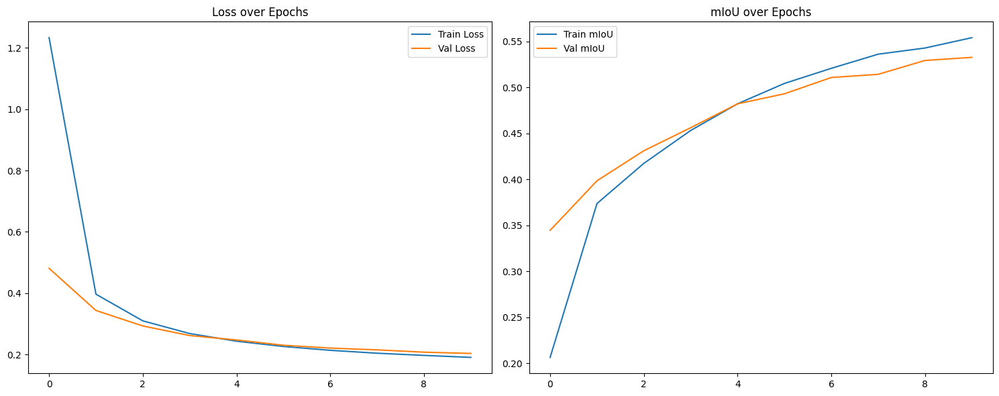

C:\Users\SHARS\AppData\Local\Temp\ipykernel_22116\3200919007.py:35: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("best_fcn8s_model.pth"))


Best model loaded.


Testing: 100%|██████████| 500/500 [00:11<00:00, 42.77it/s]
C:\Users\SHARS\AppData\Local\Temp\ipykernel_22116\2724766315.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab20', 13)


Test mIoU: 0.5126


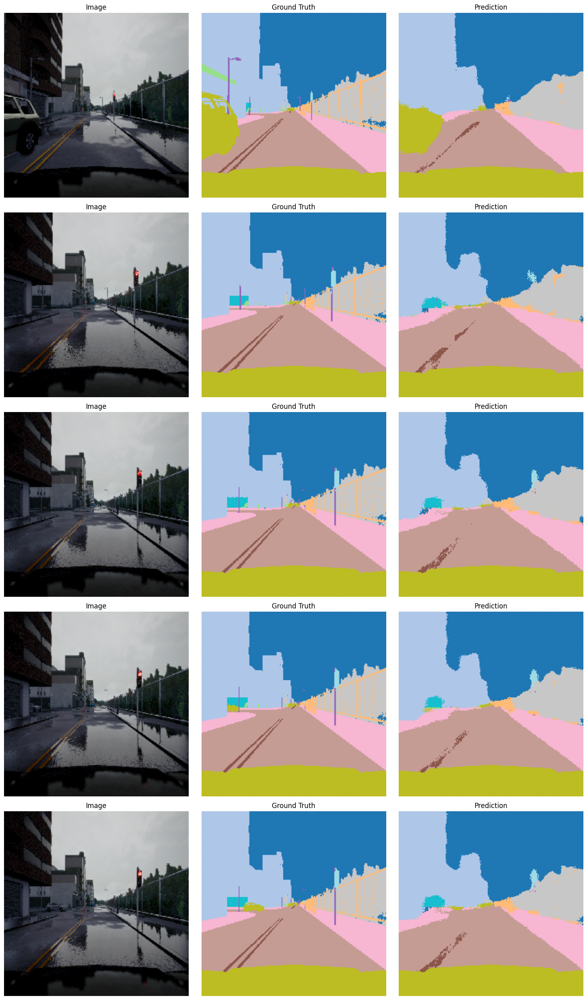

In [33]:
# ---------------------- Main ----------------------
def main():
    data_dir = "./dataset_224"
    train_img_dir = os.path.join(data_dir, "train/images")
    train_mask_dir = os.path.join(data_dir, "train/labels")
    test_img_dir = os.path.join(data_dir, "test/images")
    test_mask_dir = os.path.join(data_dir, "test/labels")

    # Dataset & transforms
    train_dataset = SegmentationDataset(train_img_dir, train_mask_dir, transform=get_train_transform())
    train_size = int(0.8 * len(train_dataset))
    val_size = len(train_dataset) - train_size
    train_subset, val_subset = torch.utils.data.random_split(train_dataset, [train_size, val_size])

    test_dataset = SegmentationDataset(test_img_dir, test_mask_dir, transform=get_test_transform())

    train_loader = DataLoader(train_subset, batch_size=8, shuffle=True)
    val_loader = DataLoader(val_subset, batch_size=8, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

    model = FCN8s(num_classes=13,freeze_backbone=True).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-4)

    # Train
    print("Training FCN-16s...")
    train_losses, train_ious, val_losses, val_ious = train_model(
        model, train_loader, val_loader, criterion, optimizer, num_epochs=10
    )

    # Plot metrics
    plot_metrics(train_losses, train_ious, val_losses, val_ious)

    # Load best model
    model.load_state_dict(torch.load("best_fcn8s_model.pth"))
    print("Best model loaded.")

    # Evaluate on test set
    model.eval()
    test_iou = 0
    with torch.no_grad():
        for images, masks in tqdm(test_loader, desc="Testing"):
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            test_iou += mean_iou(outputs, masks)

    test_iou /= len(test_loader)
    print(f"Test mIoU: {test_iou:.4f}")

    # Visualize
    visualize_predictions(model, test_loader, num_samples=5)

if __name__ == "__main__":
    main()

Stats->

Best model Val mIoU-> 0.5328

Best model Test mIoU-> 0.5126

Now for fine-tuning

Fine tuned section 1.2.2


FCN-32s Fine tuned

In [34]:
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=50):
    train_losses, train_ious = [], []
    val_losses, val_ious = [], []

    best_val_iou = 0.0

    for epoch in range(num_epochs):
        model.train()
        epoch_train_loss, epoch_train_iou = 0, 0
        train_batches = 0

        for images, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Training"):
            images, masks = images.to(device), masks.to(device)

            outputs = model(images)
            loss = criterion(outputs, masks)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            epoch_train_loss += loss.item()
            epoch_train_iou += mean_iou(outputs, masks)
            train_batches += 1

        model.eval()
        epoch_val_loss, epoch_val_iou = 0, 0
        val_batches = 0

        with torch.no_grad():
            for images, masks in tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Validation"):
                images, masks = images.to(device), masks.to(device)

                outputs = model(images)
                loss = criterion(outputs, masks)

                epoch_val_loss += loss.item()
                epoch_val_iou += mean_iou(outputs, masks)
                val_batches += 1

        # Averages
        epoch_train_loss /= train_batches
        epoch_train_iou /= train_batches
        epoch_val_loss /= val_batches
        epoch_val_iou /= val_batches

        train_losses.append(epoch_train_loss)
        train_ious.append(epoch_train_iou)
        val_losses.append(epoch_val_loss)
        val_ious.append(epoch_val_iou)

        print(f"\nEpoch {epoch+1}:")
        print(f"Train Loss: {epoch_train_loss:.4f}, mIoU: {epoch_train_iou:.4f}")
        print(f"Val   Loss: {epoch_val_loss:.4f}, mIoU: {epoch_val_iou:.4f}")

        if epoch_val_iou > best_val_iou:
            best_val_iou = epoch_val_iou
            torch.save(model.state_dict(), "best_fcn32s_ft_model.pth")
            print("Saved new best model!")

    return train_losses, train_ious, val_losses, val_ious

Training FCN-32s (fine tuned)...


Epoch 1/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.21it/s]



Epoch 1:
Train Loss: 0.6991, mIoU: 0.3067
Val   Loss: 0.3511, mIoU: 0.3941
Saved new best model!


Epoch 2/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.28it/s]



Epoch 2:
Train Loss: 0.3217, mIoU: 0.4226
Val   Loss: 0.2889, mIoU: 0.4464
Saved new best model!


Epoch 3/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.27it/s]



Epoch 3:
Train Loss: 0.2793, mIoU: 0.4618
Val   Loss: 0.2586, mIoU: 0.4730
Saved new best model!


Epoch 4/10 - Validation: 100%|██████████| 50/50 [00:08<00:00,  5.82it/s]



Epoch 4:
Train Loss: 0.2563, mIoU: 0.4924
Val   Loss: 0.2412, mIoU: 0.4973
Saved new best model!


Epoch 5/10 - Validation: 100%|██████████| 50/50 [00:07<00:00,  7.11it/s]



Epoch 5:
Train Loss: 0.2400, mIoU: 0.5133
Val   Loss: 0.2278, mIoU: 0.5137
Saved new best model!


Epoch 6/10 - Validation: 100%|██████████| 50/50 [00:07<00:00,  7.13it/s]



Epoch 6:
Train Loss: 0.2271, mIoU: 0.5284
Val   Loss: 0.2201, mIoU: 0.5293
Saved new best model!


Epoch 7/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.21it/s]



Epoch 7:
Train Loss: 0.2189, mIoU: 0.5426
Val   Loss: 0.2116, mIoU: 0.5391
Saved new best model!


Epoch 8/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.31it/s]



Epoch 8:
Train Loss: 0.2105, mIoU: 0.5528
Val   Loss: 0.2066, mIoU: 0.5466
Saved new best model!


Epoch 9/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.30it/s]



Epoch 9:
Train Loss: 0.2045, mIoU: 0.5637
Val   Loss: 0.1997, mIoU: 0.5576
Saved new best model!


Epoch 10/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.37it/s]



Epoch 10:
Train Loss: 0.1985, mIoU: 0.5717
Val   Loss: 0.1979, mIoU: 0.5613
Saved new best model!


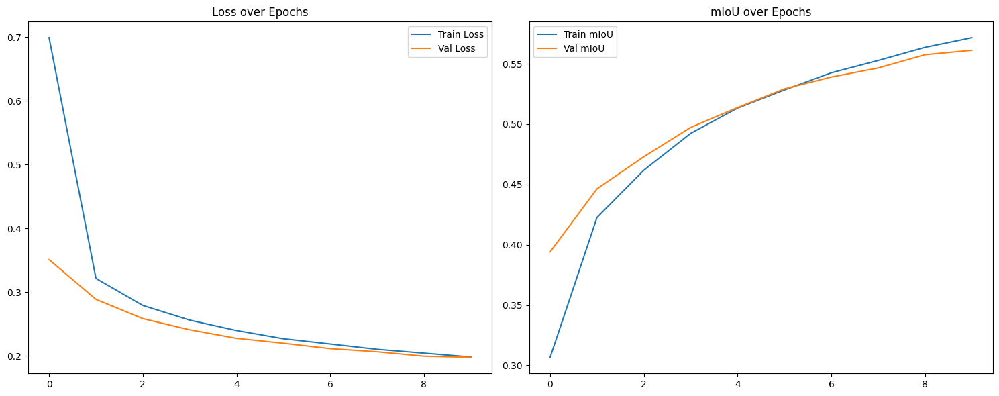

C:\Users\SHARS\AppData\Local\Temp\ipykernel_22116\812053292.py:35: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("best_fcn32s_ft_model.pth")

Best model loaded.


Testing: 100%|██████████| 500/500 [00:11<00:00, 45.14it/s]
C:\Users\SHARS\AppData\Local\Temp\ipykernel_22116\2724766315.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab20', 13)


Test mIoU: 0.5503


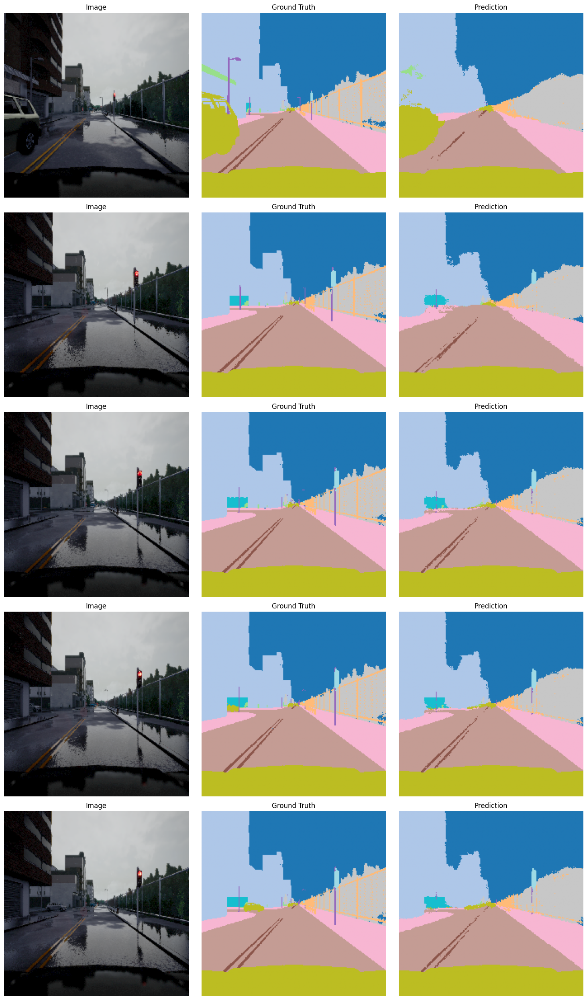

In [35]:
# ---------------------- Main ----------------------
def main():
    data_dir = "./dataset_224"
    train_img_dir = os.path.join(data_dir, "train/images")
    train_mask_dir = os.path.join(data_dir, "train/labels")
    test_img_dir = os.path.join(data_dir, "test/images")
    test_mask_dir = os.path.join(data_dir, "test/labels")

    # Dataset & transforms
    train_dataset = SegmentationDataset(train_img_dir, train_mask_dir, transform=get_train_transform())
    train_size = int(0.8 * len(train_dataset))
    val_size = len(train_dataset) - train_size
    train_subset, val_subset = torch.utils.data.random_split(train_dataset, [train_size, val_size])

    test_dataset = SegmentationDataset(test_img_dir, test_mask_dir, transform=get_test_transform())

    train_loader = DataLoader(train_subset, batch_size=8, shuffle=True)
    val_loader = DataLoader(val_subset, batch_size=8, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

    model = FCN32s(num_classes=13,freeze_backbone=False).to(device) #fine tuning
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-4)

    # Train
    print("Training FCN-32s (fine tuned)...")
    train_losses, train_ious, val_losses, val_ious = train_model(
        model, train_loader, val_loader, criterion, optimizer, num_epochs=10
    )

    # Plot metrics
    plot_metrics(train_losses, train_ious, val_losses, val_ious)

    # Load best model
    model.load_state_dict(torch.load("best_fcn32s_ft_model.pth"))
    print("Best model loaded.")

    # Evaluate on test set
    model.eval()
    test_iou = 0
    with torch.no_grad():
        for images, masks in tqdm(test_loader, desc="Testing"):
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            test_iou += mean_iou(outputs, masks)

    test_iou /= len(test_loader)
    print(f"Test mIoU: {test_iou:.4f}")

    # Visualize
    visualize_predictions(model, test_loader, num_samples=5)

if __name__ == "__main__":
    main()

Stats -> 

Best model Val mIoU->0.5613

Best model Test mIoU->0.5503


Fcn 16s fine tuned

In [36]:
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=50):
    train_losses, train_ious = [], []
    val_losses, val_ious = [], []

    best_val_iou = 0.0

    for epoch in range(num_epochs):
        model.train()
        epoch_train_loss, epoch_train_iou = 0, 0
        train_batches = 0

        for images, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Training"):
            images, masks = images.to(device), masks.to(device)

            outputs = model(images)
            loss = criterion(outputs, masks)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            epoch_train_loss += loss.item()
            epoch_train_iou += mean_iou(outputs, masks)
            train_batches += 1

        model.eval()
        epoch_val_loss, epoch_val_iou = 0, 0
        val_batches = 0

        with torch.no_grad():
            for images, masks in tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Validation"):
                images, masks = images.to(device), masks.to(device)

                outputs = model(images)
                loss = criterion(outputs, masks)

                epoch_val_loss += loss.item()
                epoch_val_iou += mean_iou(outputs, masks)
                val_batches += 1

        # Averages
        epoch_train_loss /= train_batches
        epoch_train_iou /= train_batches
        epoch_val_loss /= val_batches
        epoch_val_iou /= val_batches

        train_losses.append(epoch_train_loss)
        train_ious.append(epoch_train_iou)
        val_losses.append(epoch_val_loss)
        val_ious.append(epoch_val_iou)

        print(f"\nEpoch {epoch+1}:")
        print(f"Train Loss: {epoch_train_loss:.4f}, mIoU: {epoch_train_iou:.4f}")
        print(f"Val   Loss: {epoch_val_loss:.4f}, mIoU: {epoch_val_iou:.4f}")

        if epoch_val_iou > best_val_iou:
            best_val_iou = epoch_val_iou
            torch.save(model.state_dict(), "best_fcn16s_ft_model.pth")
            print("Saved new best model!")

    return train_losses, train_ious, val_losses, val_ious

Training FCN-16s (fine tuned)...


Epoch 1/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.19it/s]



Epoch 1:
Train Loss: 0.6826, mIoU: 0.3177
Val   Loss: 0.3036, mIoU: 0.4170
Saved new best model!


Epoch 2/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.31it/s]



Epoch 2:
Train Loss: 0.2640, mIoU: 0.4535
Val   Loss: 0.2385, mIoU: 0.4689
Saved new best model!


Epoch 3/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.50it/s]



Epoch 3:
Train Loss: 0.2188, mIoU: 0.5081
Val   Loss: 0.2127, mIoU: 0.5134
Saved new best model!


Epoch 4/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.35it/s]



Epoch 4:
Train Loss: 0.1941, mIoU: 0.5441
Val   Loss: 0.1922, mIoU: 0.5467
Saved new best model!


Epoch 5/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.42it/s]



Epoch 5:
Train Loss: 0.1778, mIoU: 0.5761
Val   Loss: 0.1812, mIoU: 0.5774
Saved new best model!


Epoch 6/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.32it/s]



Epoch 6:
Train Loss: 0.1653, mIoU: 0.6064
Val   Loss: 0.1694, mIoU: 0.5970
Saved new best model!


Epoch 7/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.36it/s]



Epoch 7:
Train Loss: 0.1561, mIoU: 0.6217
Val   Loss: 0.1638, mIoU: 0.6045
Saved new best model!


Epoch 8/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.34it/s]



Epoch 8:
Train Loss: 0.1492, mIoU: 0.6327
Val   Loss: 0.1587, mIoU: 0.6159
Saved new best model!


Epoch 9/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.48it/s]



Epoch 9:
Train Loss: 0.1436, mIoU: 0.6473
Val   Loss: 0.1544, mIoU: 0.6240
Saved new best model!


Epoch 10/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.47it/s]



Epoch 10:
Train Loss: 0.1388, mIoU: 0.6575
Val   Loss: 0.1527, mIoU: 0.6344
Saved new best model!


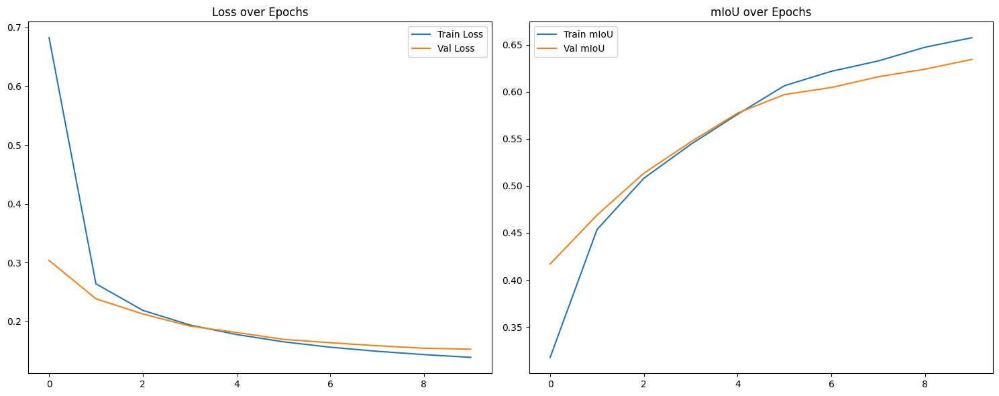

C:\Users\SHARS\AppData\Local\Temp\ipykernel_22116\895573969.py:35: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("best_fcn16s_ft_model.pth")

Best model loaded.


Testing: 100%|██████████| 500/500 [00:10<00:00, 47.26it/s]


Test mIoU: 0.6101


C:\Users\SHARS\AppData\Local\Temp\ipykernel_22116\2724766315.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab20', 13)


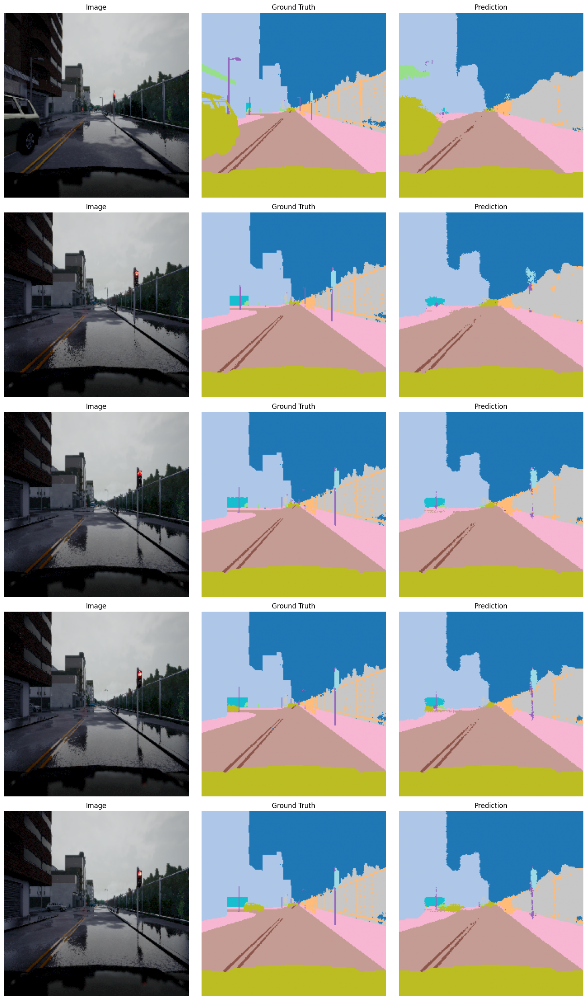

In [38]:
# ---------------------- Main ----------------------
def main():
    data_dir = "./dataset_224"
    train_img_dir = os.path.join(data_dir, "train/images")
    train_mask_dir = os.path.join(data_dir, "train/labels")
    test_img_dir = os.path.join(data_dir, "test/images")
    test_mask_dir = os.path.join(data_dir, "test/labels")

    # Dataset & transforms
    train_dataset = SegmentationDataset(train_img_dir, train_mask_dir, transform=get_train_transform())
    train_size = int(0.8 * len(train_dataset))
    val_size = len(train_dataset) - train_size
    train_subset, val_subset = torch.utils.data.random_split(train_dataset, [train_size, val_size])

    test_dataset = SegmentationDataset(test_img_dir, test_mask_dir, transform=get_test_transform())

    train_loader = DataLoader(train_subset, batch_size=8, shuffle=True)
    val_loader = DataLoader(val_subset, batch_size=8, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

    model = FCN16s(num_classes=13,freeze_backbone=False).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-4)

    # Train
    print("Training FCN-16s (fine tuned)...")
    train_losses, train_ious, val_losses, val_ious = train_model(
        model, train_loader, val_loader, criterion, optimizer, num_epochs=10
    )

    # Plot metrics
    plot_metrics(train_losses, train_ious, val_losses, val_ious)

    # Load best model
    model.load_state_dict(torch.load("best_fcn16s_ft_model.pth"))
    print("Best model loaded.")

    # Evaluate on test set
    model.eval()
    test_iou = 0
    with torch.no_grad():
        for images, masks in tqdm(test_loader, desc="Testing"):
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            test_iou += mean_iou(outputs, masks)

    test_iou /= len(test_loader)
    print(f"Test mIoU: {test_iou:.4f}")

    # Visualize
    visualize_predictions(model, test_loader, num_samples=5)

if __name__ == "__main__":
    main()

Stats->

Best model Val mIoU-> 0.6344

Best model Test mIoU-> 0.6101

FCN-8s (fine tuned)

In [39]:
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=50):
    train_losses, train_ious = [], []
    val_losses, val_ious = [], []

    best_val_iou = 0.0

    for epoch in range(num_epochs):
        model.train()
        epoch_train_loss, epoch_train_iou = 0, 0
        train_batches = 0

        for images, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Training"):
            images, masks = images.to(device), masks.to(device)

            outputs = model(images)
            loss = criterion(outputs, masks)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            epoch_train_loss += loss.item()
            epoch_train_iou += mean_iou(outputs, masks)
            train_batches += 1

        model.eval()
        epoch_val_loss, epoch_val_iou = 0, 0
        val_batches = 0

        with torch.no_grad():
            for images, masks in tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Validation"):
                images, masks = images.to(device), masks.to(device)

                outputs = model(images)
                loss = criterion(outputs, masks)

                epoch_val_loss += loss.item()
                epoch_val_iou += mean_iou(outputs, masks)
                val_batches += 1

        # Averages
        epoch_train_loss /= train_batches
        epoch_train_iou /= train_batches
        epoch_val_loss /= val_batches
        epoch_val_iou /= val_batches

        train_losses.append(epoch_train_loss)
        train_ious.append(epoch_train_iou)
        val_losses.append(epoch_val_loss)
        val_ious.append(epoch_val_iou)

        print(f"\nEpoch {epoch+1}:")
        print(f"Train Loss: {epoch_train_loss:.4f}, mIoU: {epoch_train_iou:.4f}")
        print(f"Val   Loss: {epoch_val_loss:.4f}, mIoU: {epoch_val_iou:.4f}")

        if epoch_val_iou > best_val_iou:
            best_val_iou = epoch_val_iou
            torch.save(model.state_dict(), "best_fcn8s_ft_model.pth")
            print("Saved new best model!")

    return train_losses, train_ious, val_losses, val_ious

Training FCN-8s (fine tuned)...


Epoch 1/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.45it/s]



Epoch 1:
Train Loss: 0.9203, mIoU: 0.2693
Val   Loss: 0.3511, mIoU: 0.3865
Saved new best model!


Epoch 2/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.40it/s]



Epoch 2:
Train Loss: 0.2999, mIoU: 0.4165
Val   Loss: 0.2561, mIoU: 0.4462
Saved new best model!


Epoch 3/10 - Validation: 100%|██████████| 50/50 [00:07<00:00,  6.92it/s]



Epoch 3:
Train Loss: 0.2332, mIoU: 0.4767
Val   Loss: 0.2140, mIoU: 0.5009
Saved new best model!


Epoch 4/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.23it/s]



Epoch 4:
Train Loss: 0.2003, mIoU: 0.5239
Val   Loss: 0.1912, mIoU: 0.5436
Saved new best model!


Epoch 5/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.40it/s]



Epoch 5:
Train Loss: 0.1782, mIoU: 0.5639
Val   Loss: 0.1744, mIoU: 0.5741
Saved new best model!


Epoch 6/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.33it/s]



Epoch 6:
Train Loss: 0.1628, mIoU: 0.5947
Val   Loss: 0.1622, mIoU: 0.5992
Saved new best model!


Epoch 7/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.32it/s]



Epoch 7:
Train Loss: 0.1518, mIoU: 0.6159
Val   Loss: 0.1545, mIoU: 0.6187
Saved new best model!


Epoch 8/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.30it/s]



Epoch 8:
Train Loss: 0.1449, mIoU: 0.6310
Val   Loss: 0.1477, mIoU: 0.6280
Saved new best model!


Epoch 9/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.25it/s]



Epoch 9:
Train Loss: 0.1372, mIoU: 0.6451
Val   Loss: 0.1436, mIoU: 0.6329
Saved new best model!


Epoch 10/10 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.33it/s]



Epoch 10:
Train Loss: 0.1321, mIoU: 0.6540
Val   Loss: 0.1424, mIoU: 0.6326


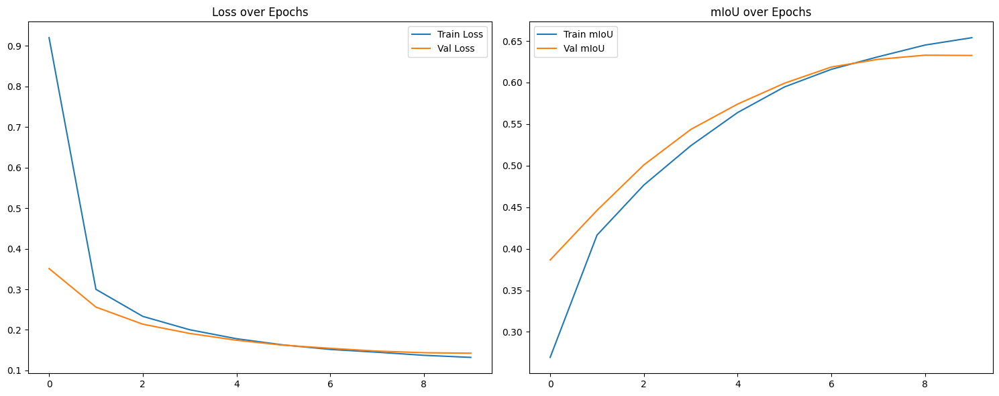

C:\Users\SHARS\AppData\Local\Temp\ipykernel_22116\3218670843.py:35: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("best_fcn8s_ft_model.pth")

Best model loaded.


Testing: 100%|██████████| 500/500 [00:10<00:00, 46.77it/s]
C:\Users\SHARS\AppData\Local\Temp\ipykernel_22116\2724766315.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab20', 13)


Test mIoU: 0.6039


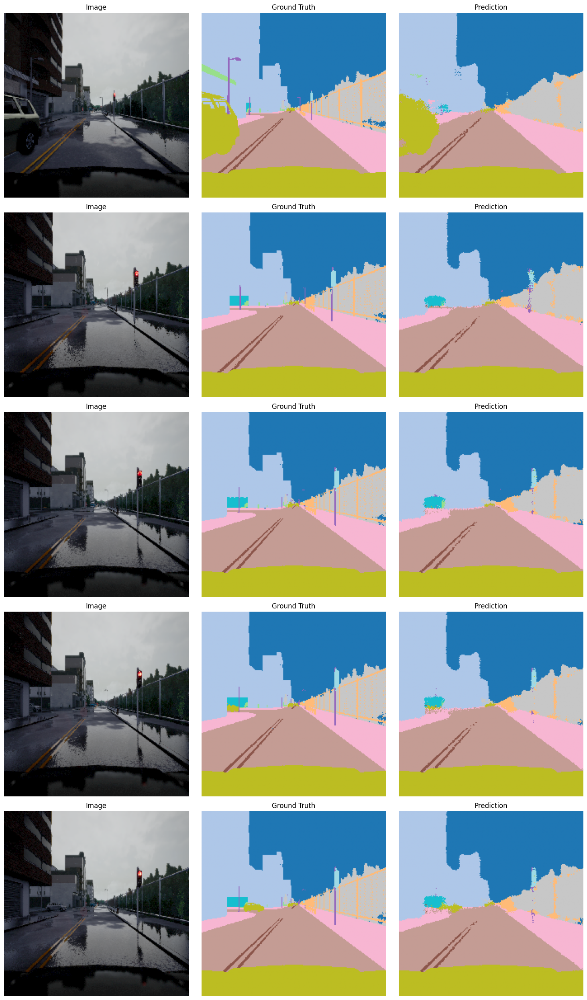

In [40]:
# ---------------------- Main ----------------------
def main():
    data_dir = "./dataset_224"
    train_img_dir = os.path.join(data_dir, "train/images")
    train_mask_dir = os.path.join(data_dir, "train/labels")
    test_img_dir = os.path.join(data_dir, "test/images")
    test_mask_dir = os.path.join(data_dir, "test/labels")

    # Dataset & transforms
    train_dataset = SegmentationDataset(train_img_dir, train_mask_dir, transform=get_train_transform())
    train_size = int(0.8 * len(train_dataset))
    val_size = len(train_dataset) - train_size
    train_subset, val_subset = torch.utils.data.random_split(train_dataset, [train_size, val_size])

    test_dataset = SegmentationDataset(test_img_dir, test_mask_dir, transform=get_test_transform())

    train_loader = DataLoader(train_subset, batch_size=8, shuffle=True)
    val_loader = DataLoader(val_subset, batch_size=8, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

    model = FCN8s(num_classes=13,freeze_backbone=False).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-4)

    # Train
    print("Training FCN-8s (fine tuned)...")
    train_losses, train_ious, val_losses, val_ious = train_model(
        model, train_loader, val_loader, criterion, optimizer, num_epochs=10
    )

    # Plot metrics
    plot_metrics(train_losses, train_ious, val_losses, val_ious)

    # Load best model
    model.load_state_dict(torch.load("best_fcn8s_ft_model.pth"))
    print("Best model loaded.")

    # Evaluate on test set
    model.eval()
    test_iou = 0
    with torch.no_grad():
        for images, masks in tqdm(test_loader, desc="Testing"):
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            test_iou += mean_iou(outputs, masks)

    test_iou /= len(test_loader)
    print(f"Test mIoU: {test_iou:.4f}")

    # Visualize
    visualize_predictions(model, test_loader, num_samples=5)

if __name__ == "__main__":
    main()

Stats->


Best model Val mIoU->0.6329

Best model Test mIoU->0.6039



1.2.3 performance analysis

### 🔍 FCN Performance Comparison

| Model Variant     | Backbone         | Val mIoU | Test mIoU | Analysis                                                                 |
|------------------|------------------|----------|-----------|--------------------------------------------------------------------------|
| FCN-32s          | Frozen           | 0.5111   | 0.4933    | Baseline model, coarse upsampling leads to lower segmentation precision. |
| FCN-32s          | Fine-tuned       | 0.5613   | 0.5503    | Fine-tuning improves feature adaptability, boosting performance.         |
| FCN-16s          | Frozen           | 0.5155   | 0.5000    | Slightly better than FCN-32s due to inclusion of pool4 features.         |
| FCN-16s          | Fine-tuned       | 0.6344   | 0.6101    | Major improvement; skip connection + fine-tuning = sharper predictions.  |
| FCN-8s           | Frozen           | 0.5328   | 0.5126    | Best among frozen models; includes pool3 + pool4 for finer detail.       |
| FCN-8s           | Fine-tuned       | 0.6329   | 0.6039    | Strong results, nearly matches FCN-16s fine-tuned, but slightly lower.   |

---

### 🧠 Explanation of FCN Architectures

| FCN Variant | Skip Connections Used | Upsampling Ratio | Characteristic |
|-------------|------------------------|------------------|----------------|
| FCN-32s     | None                   | 32×              | Coarsest output; least spatial detail preserved. |
| FCN-16s     | Pool4                  | 2× + 16×         | Adds mid-level detail; better boundary alignment. |
| FCN-8s      | Pool4 + Pool3          | 2× + 2× + 8×     | Best spatial resolution; sharpest object outlines. |

---

### 📊 Performance & Segmentation Quality Analysis

1. **Skip Connections Help!**  
   FCN-32s performs the worst in all cases, confirming that coarse upsampling alone cannot recover fine spatial details. FCN-16s and FCN-8s progressively improve by introducing skip connections that fuse high-resolution spatial features.

2. **Frozen vs. Fine-Tuned Backbones:**  
   In every variant, fine-tuning the backbone leads to a significant boost in mIoU (roughly **+4% to +12%**). This is because the pre-trained VGG16 was trained on natural images (ImageNet), and updating it allows better adaptation to the domain-specific features of your dataset.

3. **Best Overall Performer:**  
   **FCN-16s (fine-tuned)** outperforms all others with the highest validation and test mIoU. Interestingly, FCN-8s (fine-tuned) comes very close, but may slightly overfit or be noisier due to even finer features from pool3, which may include irrelevant details.

4. **Frozen Backbone Limitation:**  
   All frozen models show lower performance, especially on test sets. They rely solely on pretrained ImageNet features, which are suboptimal for pixel-level understanding tasks like semantic segmentation.
